# Estimation

In [1]:
using HypothesisTests, CSV
using MLJ, StableRNGs
include("pubh.jl");

In [2]:
set_default_plot_size(15cm, 12cm)
@rlibrary readr
@rimport pubh

## The Normal distribution

:::{.callout-tip}
## Example

A normal curve was calculated from the diastolic blood pressures of 500 men (mean 82 mm Hg, standard deviation 10 mm Hg). What is the probability of finding a man with a DBP > 72 mm Hg if we assume a normal distribution?

:::

Before we answer this problem, we need to think about our answer. By definition, the mean value is at the centre, so the area under the curve (AUC) AUC = 50% to each side. As the value of 72 is less than the mean (82), we already know that the solution has to be greater than 50%.


The `cdf` is the cumulative distribution function, i.e., the area under the curve to the left of our asking point. In this example, we want to know the AUC to the right of 72.

In [3]:
 1 - cdf(Normal(82, 10), 72) |> r3

0.841

Let's report as percentage:

In [4]:
(1-cdf(Normal(82, 10), 72)) * 100 |> r3

84.134

::: callout-caution
## Exercise

What is the probability of finding a man with a DBP < 65 mm Hg in our current example?

:::

In [5]:
#| code-fold: true
cdf(Normal(82, 10), 65) * 100 |> r3

4.457

What would be the value of DBP which would contain 97.5% of the population (to the left of the curve)?

This is the opposite problem than the previous one. Now we know the probability and would like to know the value that would contain that probability. For finding *quantiles* in the normal curve, we use the `quantile` command.

In [6]:
quantile(Normal(82, 10), 0.975) |> r3

101.6

::: callout-caution
## Exercise

What would be value of DBP which would contain 2.5% of the population (to the left of the curve)?
:::

In [7]:
#| code-fold: true
quantile(Normal(82, 10), 0.025) |> r3

62.4

So, the limits that would contain 95% of the population around the mean are:

In [8]:
r3.(reference_range(82, 10))

2-element Vector{Float64}:
  62.4
 101.6

Which $z$-value would contain 97.5% of the standard normal curve?

In [9]:
quantile(Normal(0, 1), 0.975) |> r3

1.96

Let's check on the distribution of *height* from the WCGS dataset.

In [10]:
wcgs = read_rds("data/wcgs.rds") |> rcopy
wcgs |> schema

┌──────────┬───────────────────────────────┬────────────────────────────────────
│ names    │ scitypes                      │ types                             ⋯
├──────────┼───────────────────────────────┼────────────────────────────────────
│ id       │ Count                         │ Int64                             ⋯
│ age      │ Count                         │ Int64                             ⋯
│ height   │ Continuous                    │ Float64                           ⋯
│ weight   │ Continuous                    │ Float64                           ⋯
│ sbp      │ Count                         │ Int64                             ⋯
│ dbp      │ Count                         │ Int64                             ⋯
│ chol     │ Union{Missing, Count}         │ Union{Missing, Int64}             ⋯
│ beh_pat  │ Multiclass{4}                 │ CategoricalValue{String, UInt32}  ⋯
│ ncigs    │ Count                         │ Int64                             ⋯
│ dib_pat  │ Multiclass{2}  

In [11]:
estat(@select(wcgs, :height), ["Height (cm)"])

Row,Variable,n,Median,Mean,SD,CV
,String,Int64,Float64,Float64,Float64,Float64
1,Height (cm),3154,177.8,177.235,6.423,0.036


In [12]:
#| label: fig-fig1
#| fig-cap: "QQ-plot of height in males from the WCGS dataset."
qq_plot(wcgs.height, ylab =  "Height (cm)")

## Log-normal distribution

Some variables, which distribution is right-skewed, can be approximate to a normal distribution after a log-transformation.

Let's load the vector `IgM` from the `R` package `ISwR`. For consistency, we will use a data frame.

In [13]:
igm = rcopy(R"ISwR::IgM");

In [14]:
IgM = DataFrame(igm = igm);

Descriptive statistics:

In [15]:
summarize(IgM, :igm)

    | Obs | Mean  | Std. Dev. |  Min  |  Max  
----------------------------------------------
igm | 298 | 0.803 |     0.469 | 0.100 | 4.500 


In [16]:
estat(
	@select(IgM, {:igm}),
	["IgM (mg/ml)"]
)

Row,Variable,n,Median,Mean,SD,CV
,String,Int64,Float64,Float64,Float64,Float64
1,IgM (mg/ml),298,0.7,0.803,0.469,0.585


Let's compare the skweness of height and IgM:

In [17]:
skewness(wcgs.height) |> r3, skewness(IgM.igm) |> r3

(-0.199, 2.554)

Clearly, our variable is positively (right) skewed. Let's check on the corresponding QQ-plot.

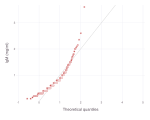

In [18]:
#| label: fig-fig2
#| fig-cap: "QQ-plot of IgM concentration in the blood against the standard normal distribution."
qq_plot(IgM.igm, ylab = "IgM (mg/ml)")

And now, with a log-transformation:

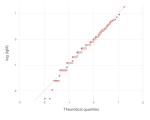

In [19]:
#| label: fig-fig3
#| fig-cap: "QQ-plot of log(IgM) against the standard normal distribution."
qq_plot(log.(IgM.igm), ylab = "log (IgM)")

If we calculate the reference range, the result makes no sense, as, of course, we cannot have negative concentrations.

In [20]:
r3.(reference_range(mean(IgM.igm), std(IgM.igm)))

2-element Vector{Float64}:
 -0.117
  1.723

We should make the calculation in the log scale and then back transform the results.

In [21]:
igm_log = log.(IgM.igm)
r3.(exp.(reference_range(mean(igm_log), std(igm_log))))

2-element Vector{Float64}:
 0.238
 2.031

## Random Sampling

When we take a sample, we calculate a statistic, an estimate of a parameter in the original population where the sample was initially taken.

This process, of statistical inference is reliable and robust if the process is not biased. One way to avoid bias is through random sampling. The function `sample` allows us to take random samples from variables.

To have the same results, we will set up a seed before the sampling.

In [22]:
rng = StableRNG(576);

Look at the statistics from random samples with decreasing sample size.

In [23]:
estat(
  @select(wcgs[sample(rng, 1:nrow(wcgs), 100), :], {:height})
)

Row,Variable,n,Median,Mean,SD,CV
,Symbol,Int64,Float64,Float64,Float64,Float64
1,height,100,177.8,176.251,6.537,0.037


In [24]:
estat(
  @select(wcgs[sample(rng, 1:nrow(wcgs), 50), :], {:height})
)

Row,Variable,n,Median,Mean,SD,CV
,Symbol,Int64,Float64,Float64,Float64,Float64
1,height,50,177.8,177.546,6.099,0.034


In [25]:
estat(
  @select(wcgs[sample(rng, 1:nrow(wcgs), 25), :], {:height})
)

Row,Variable,n,Median,Mean,SD,CV
,Symbol,Int64,Float64,Float64,Float64,Float64
1,height,25,177.8,177.19,5.74,0.032


In [26]:
estat(
  @select(wcgs[sample(rng, 1:nrow(wcgs), 10), :], {:height})
)

Row,Variable,n,Median,Mean,SD,CV
,Symbol,Int64,Float64,Float64,Float64,Float64
1,height,10,175.26,174.752,7.063,0.04


So, even with a sample as small size as $n=10$, the sample statistics are a good estimate of the corresponding statistics in the population.

## Confidence Intervals

Reference range and confidence intervals are not the same.

- The reference range is about the limits that would contain 95% of the observations in a sample or population.
- The confidence interval is about the limits that would contain a given proportion (most of the times, 95%; sometimes, 99%) of the true value of a given parameter (e.g., the mean) in a population.

For the calculation of the reference range, we used about two standard deviations (~ 1.96) around the mean (as we assumed a normal distribution). For the confidence interval, we use about two standard errors around the mean.

### $t$-distribution

The $t$-distribution is also bell shaped, but with a heavier tail. It has one more parameter than the normal distribution: the degrees of freedom (df). For our example:

$$df=n-1$$

where, $n$ is the sample size. As the sample size increases, the $t$-distribution is almost the same as the normal distribution (for $n>30$).

The next tutorial goes deeper into hypothesis testing. We can estimate confidence intervals around the mean from a sample using a one side $t$-test:

In [27]:
r3.(OneSampleTTest(wcgs.height) |> confint)

(177.011, 177.46)

In [28]:
r3.(ci_mean(wcgs.height))

2-element Vector{Float64}:
 177.01
 177.46

We can also estimate 95% CI by the method of bootstrap:

In [29]:
pubh.bst(wcgs.dbp) |> rcopy

Row,stat,estimate,%CI,lower,upper
,String,Float64,Float64,Float64,Float64
1,mean,82.02,95.0,81.66,82.35


What about confidence intervals around the geometric mean?

In [30]:
pubh.bst(wcgs.dbp, stat="gmean") |> rcopy

Row,stat,estimate,%CI,lower,upper
,String,Float64,Float64,Float64,Float64
1,gmean,81.47,95.0,81.13,81.81


And even around the median:

In [31]:
pubh.bst(wcgs.dbp, stat="median") |> rcopy

Row,stat,estimate,%CI,lower,upper
,String,Float64,Float64,Float64,Float64
1,median,80.0,95.0,80.0,80.0


We can even estimate bootstrap confidence intervals stratified by a categorical variable with the `pubh` function `gen_best_df`.

In [32]:
kfm = read_rds("data/kfm.rds") |> rcopy
pubh.gen_bst_df(@formula(dl_milk ~ sex), data=kfm) |> rcopy

Row,dl_milk,LowerCI,UpperCI,sex
,Float64,Float64,Float64,Cat…
1,7.95,7.42,8.54,Boy
2,7.06,6.55,7.56,Girl


### Confidence intervals for proportions

We can use the Binomial test for a proportion. We need the number of successes and the total number of observations.

In [33]:
tabulate(wcgs, :chd)

       | Freq. | Percent |  Cum.   
-----------------------------------
No CHD |  2897 |  91.852 |  91.852 
   CHD |   257 |   8.148 | 100.000 
-----------------------------------
 Total |  3154 | 100.000 |         


In [34]:
r3.(BinomialTest(257, nrow(wcgs)) |> confint)

(0.072, 0.092)